In [95]:
import os
import argparse
import glob
import sys
from time import perf_counter
    
import librosa
import scipy
import numpy as np
from scipy.signal import lfilter
import soundfile as sf
from noisereduce import reduce_noise
import matplotlib.colors as mcolors
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import display, Audio


matplotlib.rcParams['figure.figsize'] = (20, 10)
import bruce

sys.path.append("/home/nobeljpde1/abt")

from run_reconstruction import plot
from notebooks import utils

raw_data = "/home/nobeljpde1/abt/fade_projects/din_raw2/corpus/test/tripletnoise"


files = []
for snr in os.listdir(raw_data):
    path = os.path.join(raw_data, snr, "rep00/321.wav")
    files.append([int(snr.replace("snr", "")), path])
    
def signaltonoise(a, axis=0, ddof=0):
    a = np.asanyarray(a)
    m = a.mean(axis)
    sd = a.std(axis=axis, ddof=ddof)
    snr = np.where(sd == 0, 0, m/sd)
    snr_db = 20 * np.log10(abs(snr))
    return snr_db

def sum_rmse(x):
    return np.sqrt(np.mean(x**2))

SNR:10  321.wav
4.732576958835125
0.0 1.0
0.004291864014651523 0.999680828077808
-80.0 -0.02564381353587919
6.5e-07 64.61732499555889


'SNR:10  321.wav input'

'SNR:10  321.wav recon'

SNR:8  321.wav
4.889310035854578
0.0 1.0
0.0036166892144400622 0.999450117038559
-80.0 -0.04415031488294119
6.5e-07 64.34255836333872


'SNR:8  321.wav input'

'SNR:8  321.wav recon'

SNR:6  321.wav
4.739596743136644
0.0 1.0
0.0028347984601530883 0.999143251771293
-80.0 -0.0687347073390896
6.5e-07 63.979359187541725


'SNR:6  321.wav input'

'SNR:6  321.wav recon'

SNR:4  321.wav
4.737515717744827
0.0 1.0
0.005219168898657282 0.9999709195884712
-80.0 -0.002338638672526372
6.5e-07 64.96500747788846


'SNR:4  321.wav input'

'SNR:4  321.wav recon'

SNR:2  321.wav
4.82039849460125
0.0 1.0
0.005525707245873414 0.9999554102699532
-80.0 -0.0035869991107233545
6.5e-07 64.94633625506266


'SNR:2  321.wav input'

'SNR:2  321.wav recon'

SNR:0  321.wav
4.732311449944973
0.0 1.0
0.005051770976165025 1.0
-80.0 1.4210854715202004e-14
6.5e-07 65.00000000000021


'SNR:0  321.wav input'

'SNR:0  321.wav recon'

SNR:-2  321.wav
4.742143388837576
0.0 1.0
0.0015307269898961423 1.0
-80.0 -1.4210854715202004e-14
6.5e-07 64.99999999999979


'SNR:-2  321.wav input'

'SNR:-2  321.wav recon'

SNR:-4  321.wav
4.827636621892452
0.0 1.0
0.004241178852799743 0.9997922831008664
-80.0 -0.016688129271642538
6.5e-07 64.75071131806925


'SNR:-4  321.wav input'

'SNR:-4  321.wav recon'

SNR:-6  321.wav
4.807051409035921
0.0 1.0
0.0020023090431108186 1.0
-80.0 0.0
6.5e-07 65.0


'SNR:-6  321.wav input'

'SNR:-6  321.wav recon'

SNR:-8  321.wav
4.554313361644745
0.0 1.0
0.006270287812928048 1.0
-80.0 0.0
6.5e-07 65.0


'SNR:-8  321.wav input'

'SNR:-8  321.wav recon'

SNR:-10  321.wav
4.920118518173695
0.0 1.0
0.0010507778866736958 0.9996993162922907
-80.0 -0.02407999934756333
6.5e-07 64.6405966900108


'SNR:-10  321.wav input'

'SNR:-10  321.wav recon'

SNR:-12  321.wav
4.797813415527344
0.0 1.0
0.0034861160430803683 0.9994894481300907
-80.0 -0.040987035153548845
6.5e-07 64.38944075792462


'SNR:-12  321.wav input'

'SNR:-12  321.wav recon'

SNR:-14  321.wav
4.760096192359924
0.0 1.0
0.006855952300802426 0.9997042211801297
-80.0 -0.023825653131027025
6.5e-07 64.64438250202008


'SNR:-14  321.wav input'

'SNR:-14  321.wav recon'

SNR:-16  321.wav
4.872247286140919
0.0 1.0
0.002885202109259036 1.0
-80.0 0.0
6.5e-07 65.0


'SNR:-16  321.wav input'

'SNR:-16  321.wav recon'

SNR:-18  321.wav
4.783568721264601
0.0 1.0
0.0024444566243919386 0.9998993532797645
-80.0 -0.008071467972186497
6.5e-07 64.87930811722802


'SNR:-18  321.wav input'

'SNR:-18  321.wav recon'

SNR:-20  321.wav
4.613124951720238
0.0 1.0
0.003549190521453966 0.9999448936327412
-80.0 -0.004424211751114626
6.5e-07 64.93381741006478


'SNR:-20  321.wav input'

'SNR:-20  321.wav recon'

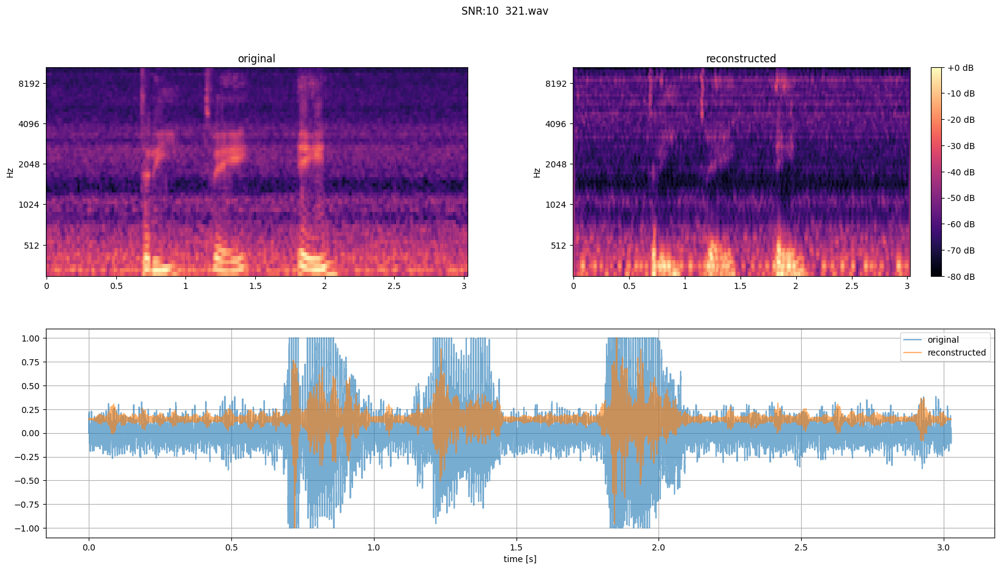

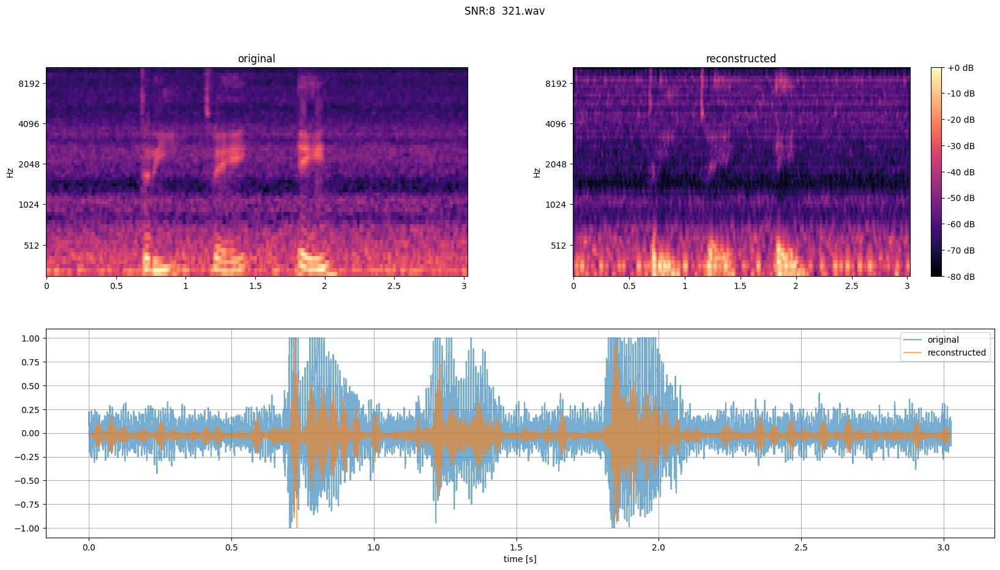

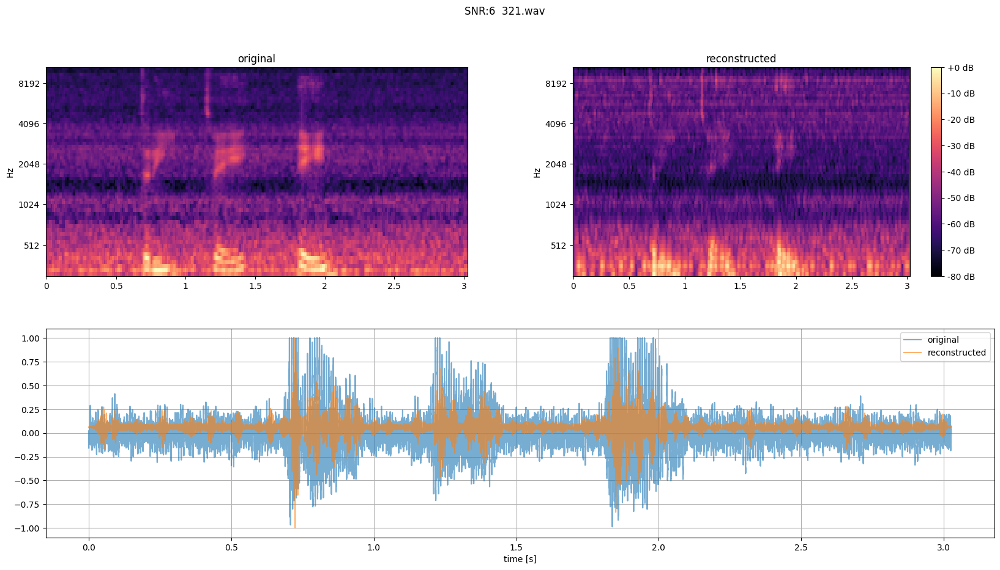

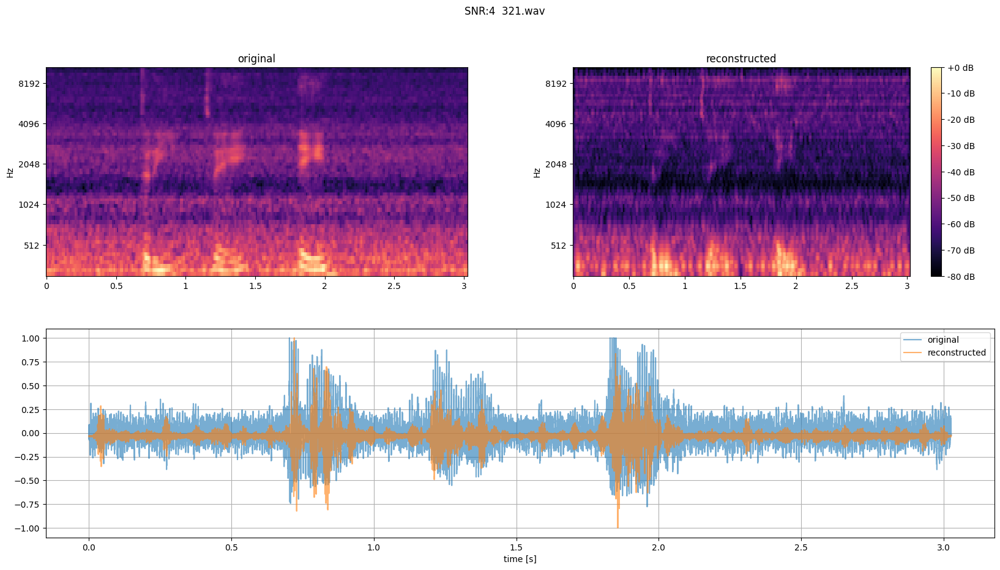

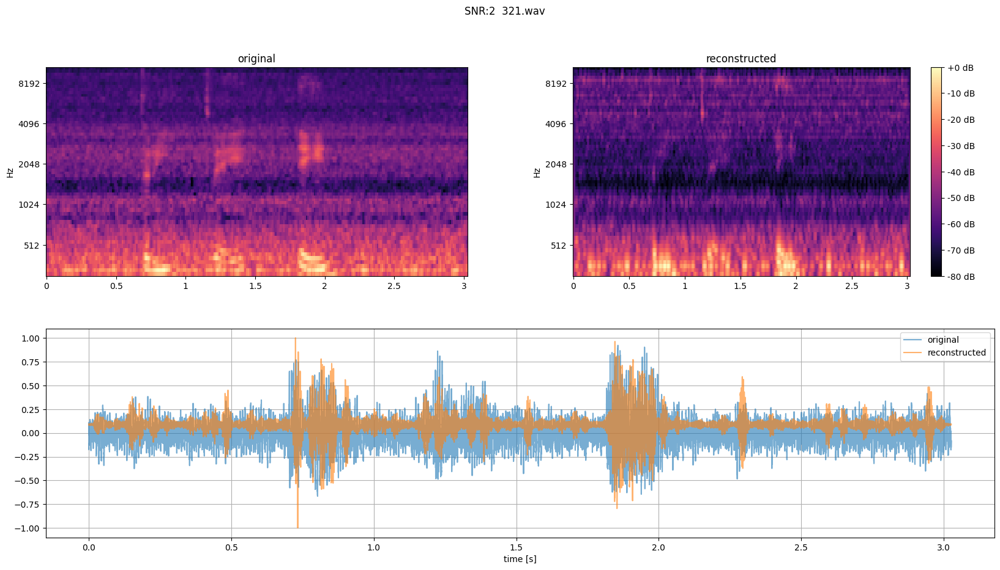

...

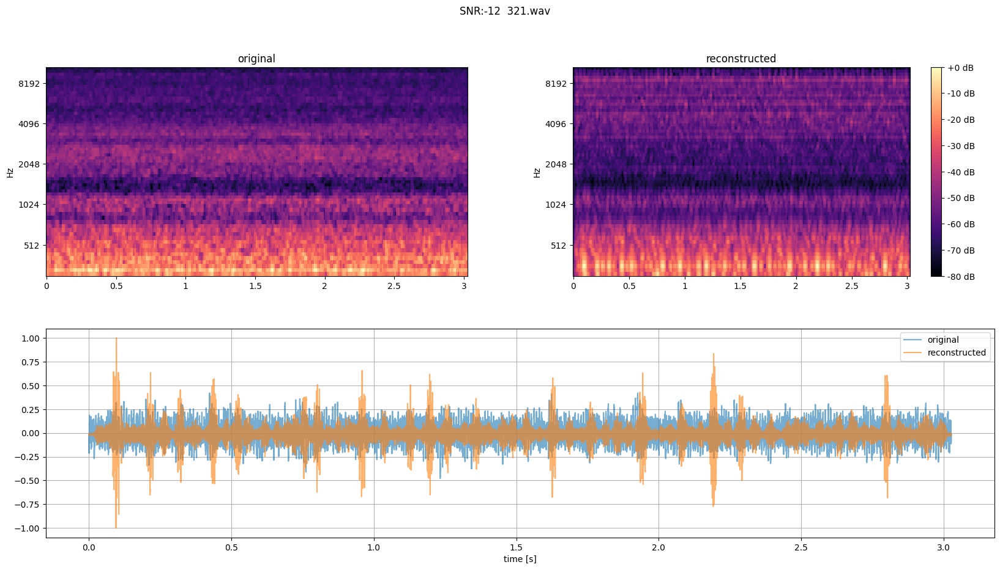

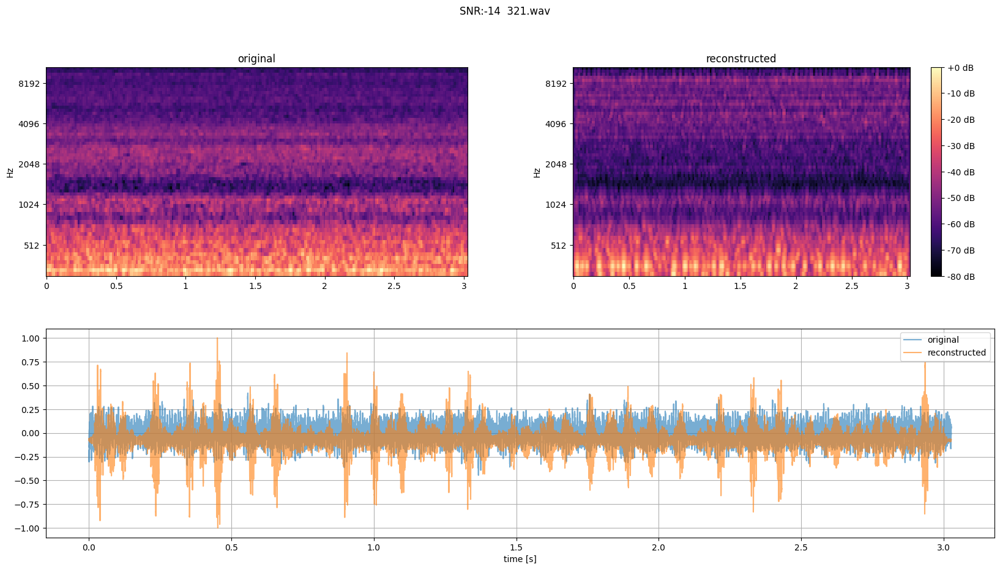

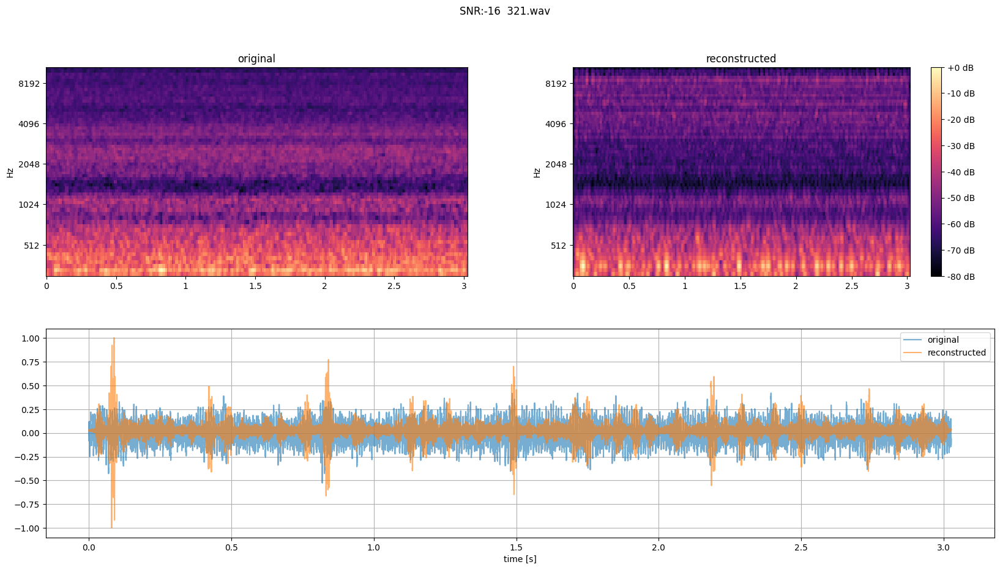

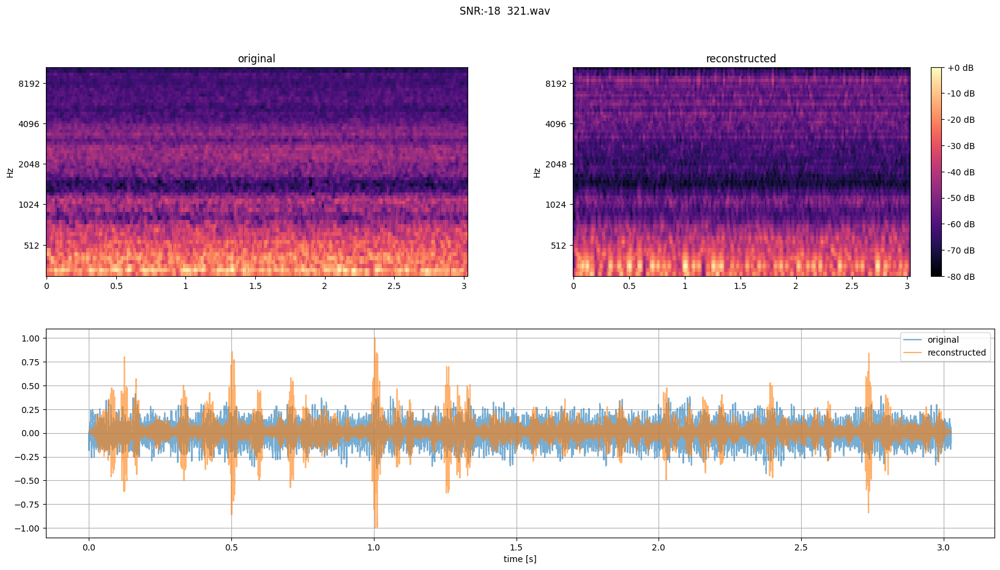

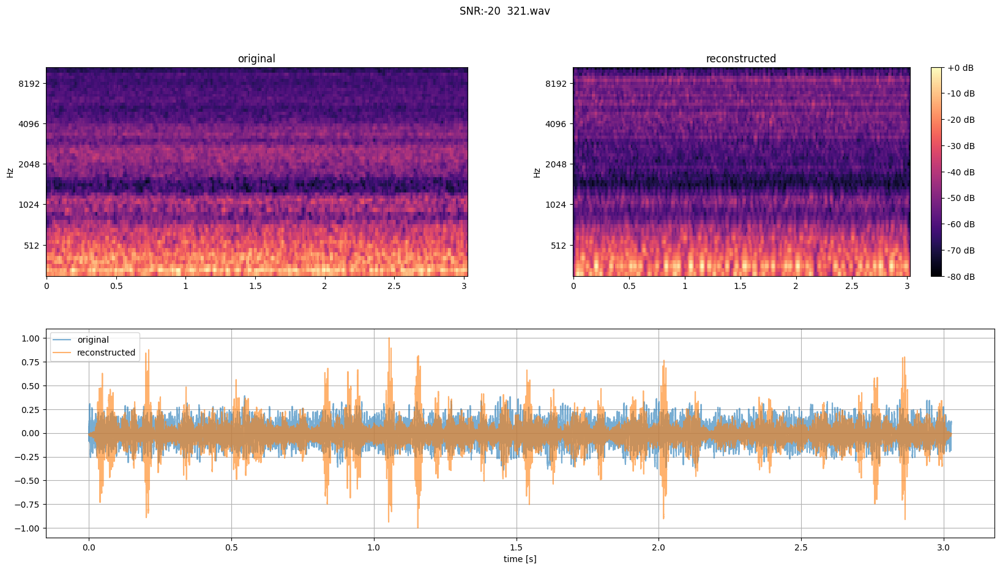

In [ ]:
N_HOP = 64
N_FFT = 2048
REF_DB = 65.0

class BruceGenerator:
    def __init__(self, min_freq = 150, max_freq = 10_500):
        bruce.set_seed(22)

        self.n_trials = 5
        self.n_fibers = 10
        
        self.n_low_med = int(np.floor(self.n_fibers / 5))
        self.n_high = self.n_fibers - (2 * self.n_low_med)
        
        self.min_freq = min_freq
        self.max_freq = max_freq
        self.n_rep = 3
        self.n_mels = 64 
        
        self.mel_scale = librosa.filters.mel_frequencies(self.n_mels, fmin=self.min_freq, fmax=self.max_freq)

        self.ng = bruce.Neurogram(
            self.mel_scale,
            n_low=10, #self.n_low_med,
            n_med=0, #self.n_low_med,
            n_high=0, #self.n_high,
            n_threads=1,
        )
        self.dt_spikes = 1e-05 
        self.ng.bin_width = self.dt_spikes
        
        # min(1 / (max_freq * 2 * n_bins), 3.6e-05)
        # this needs to use the sampling frequency of the model
        # idk why but otherwise there is a shift
        # print(f"ng bin width: {self.ng.bin_width}")
        
    @property
    def dt(self):
        return self.ng.bin_width
    
    def iter_fibers(self):
        for i in range(self.n_mels):
            for f in self.ng.get_fibers(i):
                yield f
    
    def get_sponts(self):
        return np.array([f.spont for f in self.iter_fibers()])
    
    def get_refr(self):
        return np.array([f.tabs + f.trel for f in self.iter_fibers()])
    
    
    def get_ng_data(self, stim):
        time = perf_counter()
        self.ng.bin_width = stim.time_resolution
        self.ng.create(stim, n_rep=self.n_rep, n_trials=self.n_trials)
        print(perf_counter() - time)
        self.spikes = self.ng.get_output()
        
        return self.spikes
        
    
    def rebin_data(self):
        data_binned = np.zeros((self.data.shape[0], self.data.shape[1] * 10))
        data_binned[:, ::10] = self.data.copy()
        self.data = utils.make_bins(36, data_binned)
        self.ng.bin_width *= 3.6
        
        
    def average_response(self):
        "This somehow needs to divide by n_rep * n_trials * n_fibers"
        
        # spnts = self.get_sponts()
        # n_samples = self.n_rep * self.n_trials
        # snr = self.mean_spikes / self.sd_spikes
        # normalization_constant = np.sum(spnts) * self.ng.bin_width * n_samples * snr
        # normalization_constant = self.n_trials
        # print("SR:", np.mean(spnts), np.std(spnts), len(spnts))
        # print(normalization_constant)
        # print(self.data.min(), self.data.max())  
        # self.data /= 15 #/ 64
        # p = 2
        # self.data = np.power(self.data, p) * np.sqrt(p)
        
        self.data = utils.min_max_scale(self.data, 0, 1)
        print(self.data.min(), self.data.max())  
        
    def smooth(self, window_size):
        # dm = self.data.max()
        self.data = utils.smooth(self.data, "hann", window_size, 1)
        # self.data = utils.min_max_scale(self.data, 0, dm)
        # print(self.data.min(), self.data.max())
        
    def wienerize(self, window_size = 1000):
        print(f"using {window_size * self.ng.bin_width*1000:.1f} [ms] wiener kernel")
        self.data = scipy.signal.wiener(self.data, (1, window_size))
        
    def neurogram_to_wav(self):
        # Clip outliers
        # self.data = self.data.clip(0, np.quantile(self.data.ravel(), 0.999))
        # print(self.data.min(), self.data.max())
        
        # Resample
        n_s = int(np.ceil(self.data.shape[1] / N_HOP))
        self.data = np.array([scipy.signal.resample(x, n_s) for x in self.data]).clip(0, 1)
        print(self.data.min(), self.data.max())
        # echo(data.shape)
        
        # Scale to -80, 0
        self.data = utils.min_max_scale(self.data, data_min=0, data_max=1)
        print(self.data.min(), self.data.max())
        # echo(data.min(), data.max())
        
        # Convert to power
        self.data = librosa.db_to_power(self.data, ref=REF_DB)
        print(self.data.min(), self.data.max())
        # echo(data.min(), data.max())
        reconstructed = librosa.feature.inverse.mel_to_audio(
            self.data,
            n_fft=N_FFT,
            hop_length=N_HOP,
            sr=np.ceil(1 / self.dt),
            fmin=self.min_freq,
            fmax=self.max_freq,
        )
        # echo(reconstructed.shape)
        self.reconstructed_signal = scipy.signal.resample(reconstructed, self.audio_signal.size)
        return self.reconstructed_signal
    
    def generate_neurogram(self, path):
        self.stim = bruce.stimulus.from_file(path, False, normalize=False)
        self.spikes = self.get_ng_data(self.stim)
        self.data = self.spikes.sum(axis=1)
        
        
        self.total_n_spikes = self.data.sum()
        self.max_spikes = self.data.max()
        self.mean_spikes = self.data.mean()
        self.sd_spikes = self.data.std()
        
        # self.data = self.data.clip(0, 15)
        # self.wienerize()
        self.rebin_data()
        self.smooth(2048)
        self.average_response()
        
                
        self.max_response = self.data.max()
        self.min_response = self.data.min()
        self.total_response = self.data.sum()
        
        # print("ng duration", self.data.shape[1] * self.ng.bin_width)
        return self.data, self.ng.bin_width, self.min_freq, self.max_freq, self.n_mels
            
    def __call__(self, path):
        self.audio_signal, self.audio_fs = librosa.load(path, sr=None)
        self.generate_neurogram(path)
        self.neurogram_to_wav()
        # ratio = sum_rmse(self.audio_signal) / sum_rmse(self.reconstructed_signal)
        # self.reconstructed_signal *= ratio
        
        self.reconstructed_signal = utils.min_max_scale(self.reconstructed_signal, -1, 1)
        
        
        
    __name__ = "BruceGenerator"

stats  = []
for f in sorted(files, key=lambda x:x[0])[::-1]:
    self = BruceGenerator()
    title = f"SNR:{f[0]}  {os.path.basename(f[1])}"
    print(title)
    path = f[1]
    
    self(path) 
    
    plot(
        self.audio_signal, 
        self.reconstructed_signal, 
        self.audio_fs, 
        self.n_mels, 
        self.min_freq, 
        self.max_freq, 
        title, 
        save=False
    )
    # stats.append((
    #     f[0], 
    #     bg.total_n_spikes, 
    #     bg.max_spikes, 
    #     bg.mean_spikes, 
    #     bg.sd_spikes, 
    #     bg.max_response, 
    #     bg.min_response,
    #     bg.total_response,
    #     signaltonoise(audio_signal), 
    #     signaltonoise(reconstructed_signal),
    #     np.sum(bg.get_sponts()), 
    #     bg.spikes,
    #     bg.data,        
    #     audio_signal, 
    #     reconstructed_signal,
    # ))
    
    display(f"{title} input", Audio(self.audio_signal, rate=self.audio_fs, normalize=False))
    display(f"{title} recon", Audio(self.reconstructed_signal, rate=self.audio_fs, normalize=False))
 

(64, 5, 302606)

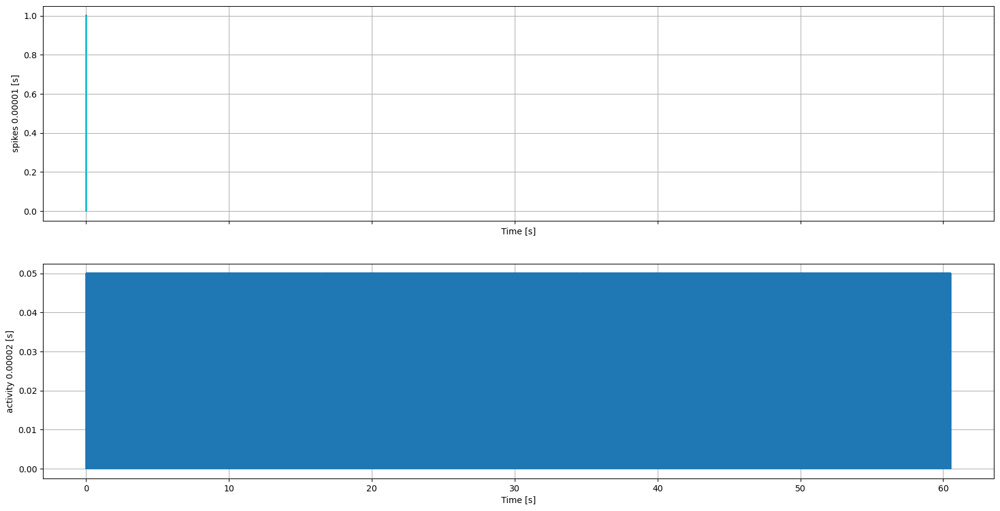

In [8]:
# dt = self.get_refr().max()
# nyq = 1 / (0.5 * dt)
# print(nyq)
# tgt_sr = np.ceil(1 / dt)

# power = 2.0
# mel_basis = librosa.filters.mel(
#     sr=tgt_sr,
#     n_fft=N_FFT, 
#     n_mels=self.n_mels, 
#     fmin=self.min_freq,
#     fmax=self.max_freq   
# )
# img = librosa.display.specshow(mel_basis, x_axis='linear')
# plt.colorbar()


# plt.plot(self.spikes[0])
# self.dt - self.get_refr().min()
# self.get_refr().max() / self.dt_spikes

# 0.001 / self.dt_spikes



import scipy.signal

def make_bins(n, data):
    if n == 1:
        return data
    return data[:, : len(data[0]) // n * n].reshape(data.shape[0], -1, n).sum(axis=2)


def activity(spikes, dt, n_bins, n_total, window_size = 16):
    dt_act = dt * n_bins
    
    act = (1 / n_total) * make_bins(n_bins, spikes)
    # act = (2 * act) - 1
    # act = np.maximum(0.0, act)
    # kernel = scipy.signal.windows.get_window("hann", window_size).reshape(1, -1)
    # act = scipy.signal.convolve2d(act, kernel)
    return act


f, (a1, a2) = plt.subplots(2, 1, sharex=True)

ts = np.arange(self.spikes.shape[1]) * self.dt_spikes
sp = self.spikes[0].copy()
a1.plot(ts, sp)


n_t = 2
n_total = self.n_trials * self.n_fibers * self.n_rep

dt_a = self.dt_spikes * n_t
ac = activity(self.spikes, self.dt_spikes, n_t, n_total)
at = np.arange(ac.shape[1]) * dt_a

a2.plot(at, ac[0])

a1.set_ylabel(f"spikes {self.dt_spikes:.5f} [s]")
a2.set_ylabel(f"activity {dt_a:.5f} [s]")

for a in a1, a2:
    a.grid()
    a.set_xlabel("Time [s]")

In [76]:
cf_i = 0
refr = np.array([f.tabs + f.trel for f in self.ng.get_fibers(cf_i)])
spnt = np.array([f.spont for f in self.ng.get_fibers(cf_i)])
# n_max = (self.dt_spikes / refr).sum() * self.n_trials * self.n_rep

# n_max, self.spikes.max()
# # * self.n_trials * self.n_rep

# self.spikes.shape,
# plt.plot(self.spikes[cf_i])

In [83]:
trial = self.spikes[0][0]
refr = np.array([f.tabs + f.trel for f in self.ng.get_fibers(cf_i)])

for factor in (1, 5, 10, 50, 100, 150, 180):
    tf = make_bins(factor, trial.reshape(1, -1))[0]
    dt = self.dt_spikes * factor
    n_max_total = max(self.n_fibers, (dt / refr).sum() * self.n_rep)
    max_activity = tf.max() / n_max_total
    print(factor, dt, tf.max(), n_max_total, max_activity)

1 1e-05 3.0 10 0.3
5 5e-05 4.0 10 0.4
10 0.0001 6.0 10 0.6
50 0.0005 8.0 10 0.8
100 0.001 13.0 10.945728257434517 1.1876779410424507
150 0.0015 14.0 16.418592386151776 0.8526918551074005
180 0.0018000000000000002 14.0 19.70231086338213 0.7105765459228338


In [85]:
# refr, spnt

refr


array([0.00121415, 0.00131142, 0.00053153, 0.00148452, 0.00100779,
       0.0003596 , 0.00139755, 0.00142482, 0.00129119, 0.00119108])

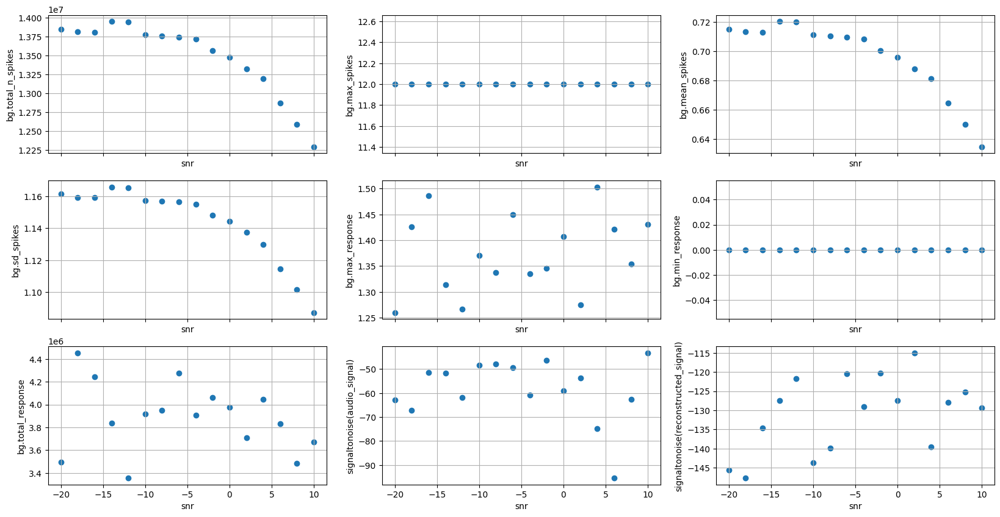

In [ ]:
labels = (
    "snr", 
    "bg.total_n_spikes", 
    "bg.max_spikes", 
    "bg.mean_spikes", 
    "bg.sd_spikes", 
    "bg.max_response", 
    "bg.min_response",
    "bg.total_response",
    "signaltonoise(audio_signal)", 
    "signaltonoise(reconstructed_signal)",
    "np.sum(bg.get_sponts())", 
    "bg.spikes",
    "bg.data",        
    "audio_signal", 
    "reconstructed_signal",
)

st = np.array([s[:10] for s in stats]).T

f, axes = plt.subplots(3, 3, sharex=True)

for i, ax in enumerate(axes.ravel(), 1):
    ax.scatter(st[0], st[i])
    ax.set_ylabel(labels[i])
    ax.set_xlabel(labels[0])
    ax.grid()


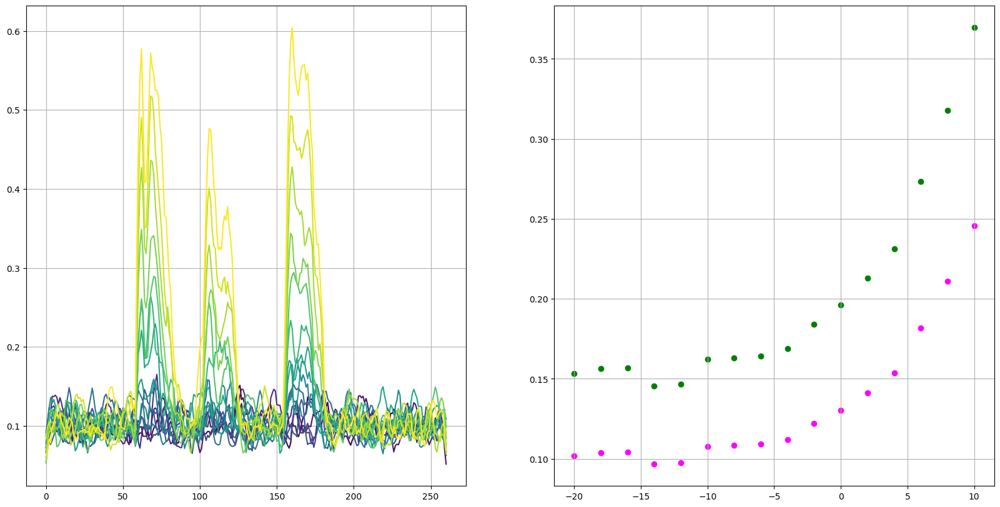

In [ ]:

r  = []
f, (ax1, ax2) = plt.subplots(1, 2)
cmap = plt.get_cmap("viridis")  # Choose any colormap
norm = mcolors.Normalize(vmin=-20, vmax=10)

for (snr, f) in sorted(files, key=lambda x:x[0]):
    wav, sr = librosa.load(f, sr=None)
    rms = librosa.feature.rms(y=wav).ravel()
    rmse = np.sqrt(np.sum(np.power(wav, 2)) / wav.size)
    
    stim = bruce.stimulus.from_file(f, False, normalize=False)
    rmse_stim = np.sqrt(np.sum(np.power(stim.data, 2)) / wav.size)
    
    ax1.plot(rms, color=cmap(norm(snr)))
    ax2.scatter([snr], [rmse], color='magenta')
    ax2.scatter([snr], [rmse_stim], color='green')
ax1.grid()
ax2.grid()
    
    

0.004165416541654167 0.1064261659132968
0.003685368536853686 0.09562261098100086
0.00385038503850385 0.12257698807766747
0.004735473547354736 0.11269526711052394
0.0036753675367536755 0.09622234183621604
0.0035653565356535666 0.09918977545615353
0.004095409540954095 0.10694236596996914
0.004295429542954295 0.11334795810822382
0.00432043204320432 0.1322445277034972
0.004405440544054405 0.10772815735834901
0.0026252625262526276 0.1013178767806353
0.002995299529952995 0.12299772525430744
0.0037503750375037503 0.10023066267674821
0.00374037403740374 0.11273939459669371
0.0034153415341534165 0.1342140298662793
0.0024402440244024404 0.11481421235190298


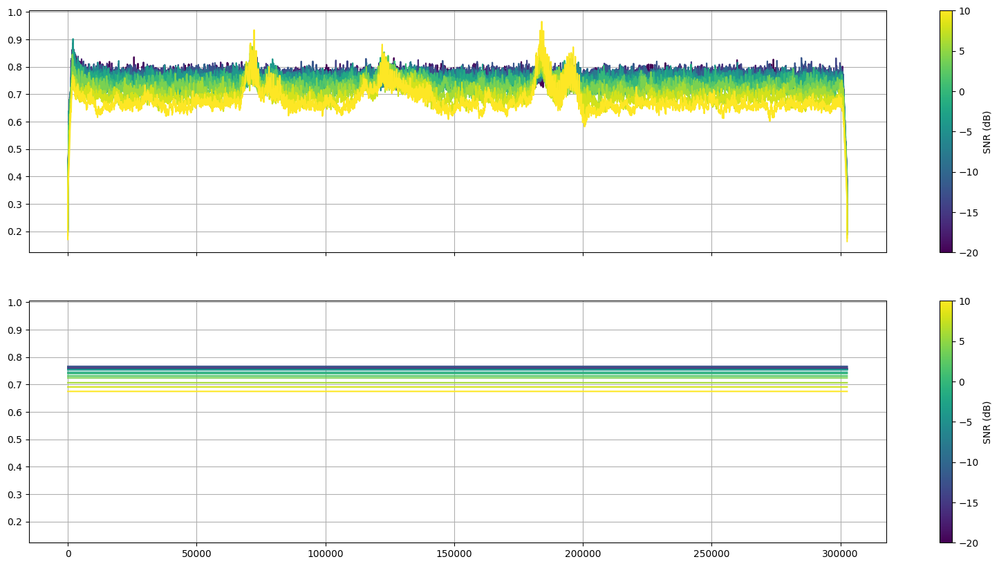

In [ ]:


cmap = plt.get_cmap("viridis")  # Choose any colormap
norm = mcolors.Normalize(vmin=-20, vmax=10)

f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True)
for s in stats:
    spikes = s[11]
    spikes = scipy.signal.wiener(spikes, (1, 3333))
    spikes /= (20 * 3)
    print(np.min(spikes), np.max(spikes))
    response = np.sum(spikes, axis=0)
    s_response = utils.smooth(response.reshape(1, -1), "hann", 128, 1)[0]

    ax1.plot(s_response, color=cmap(norm(s[0])))
    ax2.plot(np.ones(len(s_response)) * np.mean(s_response),  color=cmap(norm(s[0])))
    # break

for ax in ax1, ax2:
    ax.grid()
    cb = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
    cb.set_label("SNR (dB)")
    


In [ ]:
s[11].ravel()

array([0., 0., 0., ..., 0., 0., 0.])

0.7 / 1

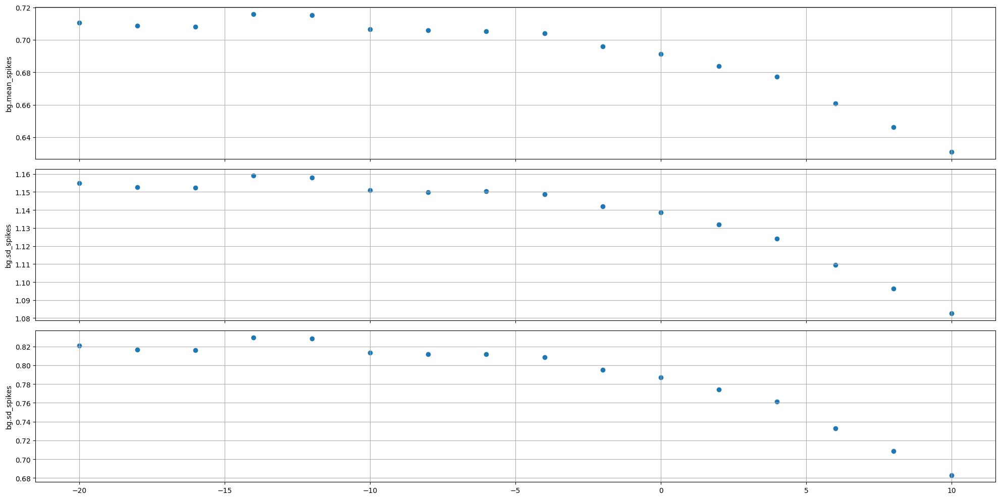

In [ ]:

y = []
y2 = []
y3 = []
y4 = []
x = []
for i in range(len(stats)):
    x.append(stats[i][0])
    y.append(
        stats[i][1] / (stats[i][10] * 3.02 * bg.n_rep * bg.n_trials)
    )
    y2.append(
        stats[i][1]
    )
    y3.append(librosa.feature.rms(y=stats[i][13]).sum())
    y4.append(librosa.feature.rms(y=stats[i][14]).sum())
    
f, (ax1, ax2, ax3) = plt.subplots(3, sharex=True)
# ax1.scatter(x, y)
# ax1.grid()
# ax1.set_ylabel("# spikes")

ax1.scatter(x, [s[3] for s in stats])
ax1.grid()
ax1.set_ylabel(labels[3])


ax2.scatter(x, [s[4] for s in stats])
ax2.grid()
ax2.set_ylabel(labels[4])

ax3.scatter(x, [s[3] * s[4]  for s in stats])
ax3.grid()
ax3.set_ylabel(labels[4])


# ax3.scatter(x, y3, label="audio")
# ax3.scatter(x, y4, label="reconstructed")
# ax3.grid()
# ax3.set_ylabel(r"$\sum RMS(x)$")
# ax3.legend()

plt.tight_layout();

In [ ]:
# scipy.signal.wiener()
inp = stats[10][11] 

inp.mean(axis=0).mean()

np.float64(0.6912715606266895)

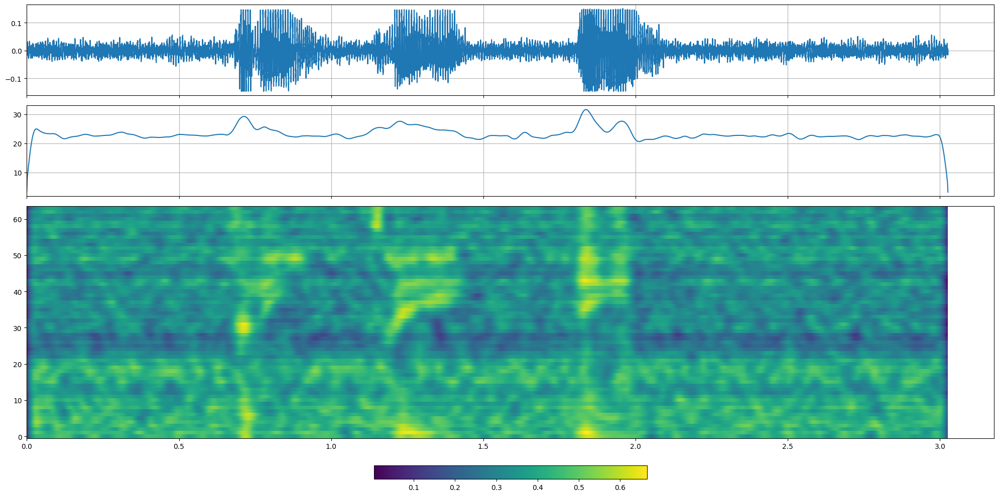

In [ ]:
data = bg.data.copy()

# data = (data - data.mean()) / data.std()
data = utils.smooth(data, "hann", 128, 1)

f, (ax0, ax1, ax2) = plt.subplots(3, 1, sharex=True, height_ratios=[1, 1, 3])
t_stim = np.arange(bg.stim.data.size) * 1 / bg.stim.sampling_rate
ax0.plot(t_stim, bg.stim.data)
ax0.grid()

t = np.arange(data.shape[1]) * bg.ng.bin_width
ax1.plot(t, data.sum(axis=0));
ax1.grid()

p = ax2.pcolormesh(t, np.arange(bg.n_mels), data)
plt.colorbar(p, ax=ax2, orientation="horizontal", pad=0.1, fraction=.05);
# ax2.set_yscale("log")

plt.tight_layout();

In [ ]:
640 / 64

10.0

In [ ]:
data = bg.data.copy()
data.min(),  data.max()

(np.float64(0.0), np.float64(0.6650129659788625))

(64, 257)


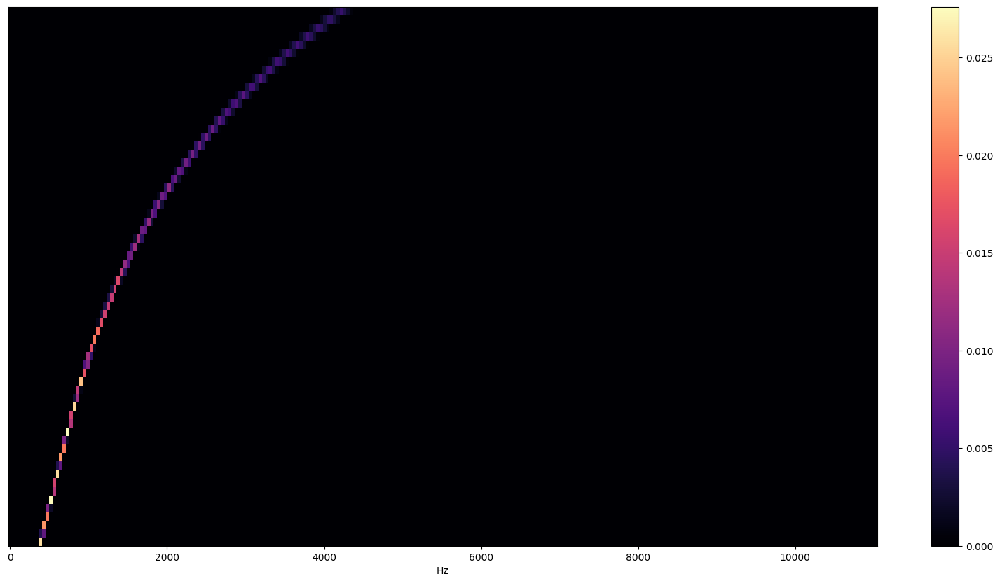

In [ ]:
data = bg.data.copy()
# n_s = int(np.ceil(data.shape[1] / N_HOP))
    # data = np.array([scipy.signal.resample(x, n_s) for x in data]).clip(0, 1)
    # echo(data.min(), data.max())
    
# Scale to -80, 0
data = utils.min_max_scale(data, data_min=0, data_max=data.max())

# # Convert to power
data = librosa.db_to_power(data, ref=65)

M = data.copy()

### mel_to_stft ###
n_fft = 512 
sr = np.ceil(1 / bg.ng.bin_width)

tgt_sr = np.ceil(1 / 3.6e-5)

# M = np.array([librosa.resample(y, orig_sr=sr, target_sr=tgt_sr) for y in M])

power = 2.0
mel_basis = librosa.filters.mel(
    sr=tgt_sr,
    n_fft=n_fft, 
    n_mels=M.shape[-2], 
    dtype=M.dtype, 
    fmin=bg.min_freq,
    fmax=bg.max_freq   
)
print(mel_basis.shape)
img = librosa.display.specshow(mel_basis, x_axis='linear')
plt.colorbar()
# inverse = librosa.util.nnls(mel_basis, M)
# inverse = np.power(inverse, 1.0 / power, ou t=inverse)  
### mel_to_stft ###

### mel_to_audio ###
# hop_length = 32
# reconstructed = librosa.feature.inverse.griffinlim(
#     inverse,
#     n_iter=32,
#     hop_length=hop_length,
#     win_length=None,
#     n_fft=n_fft,
#     window="hann",
#     center=True,
#     dtype=np.float32,
#     length=None,
#     pad_mode="constant",
# )
### mel_to_audio ###


In [ ]:
librosa.filters.mel(sr=np.ceil(1 / bg.ng.bin_width), n_fft=512)

array([[-0.0000000e+00,  1.0622167e-03,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  3.5262499e-02,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  2.1244334e-03, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       ...,
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
         7.2810659e-04,  3.6405330e-04,  1.2205740e-17]], dtype=float32)

In [ ]:
data = bg.data.copy()
data.shape

data_binned = np.zeros((data.shape[0], data.shape[1] * 10))
data_binned[:, ::10] = data
data_binned = utils.make_bins(36, data_binned)

print(data_binned.shape, data.shape)
print(data_binned.shape[1] * 3.6e-05, data.shape[1] * 1e-05 )
print(data_binned.sum() == data.sum())

(64, 23349) (64, 84057)
0.840564 0.84057
False


In [ ]:

# reconstructed = librosa.feature.inverse.mel_to_audio(
#     data,
#     n_fft=N_FFT,
#     hop_length=N_HOP,
#     sr=np.ceil(1 / binsize),
#     fmin=min_freq,
#     fmax=max_freq,
# 

data = utils.min_max_scale(bg.data, data_min=0, data_max=1)
data


array([[-68.39222599, -68.29356537, -68.19486085, ..., -64.88866249,
        -64.97764452, -65.06663697],
       [-67.32976072, -67.23411227, -67.13843978, ..., -68.12469907,
        -68.21141071, -68.29811691],
       [-66.13406907, -66.03599109, -65.93789792, ..., -65.13949354,
        -65.22469188, -65.30989256],
       ...,
       [-62.05422548, -61.96365126, -61.87309312, ..., -65.04493728,
        -65.1319956 , -65.21907854],
       [-62.57614954, -62.48330258, -62.39046823, ..., -66.23229653,
        -66.31911307, -66.40593743],
       [-62.01153655, -61.91688194, -61.8222387 , ..., -67.11254971,
        -67.19757562, -67.2825899 ]])

In [13]:
import numpy as np
from phast import PulseTrain

array = np.random.uniform(size=(15, 1000))
pt = PulseTrain(array)
pt

<PulseTrain n_pulses: 15000 duration : 0.001000>